# 1. Import Libraries

In [1]:
import os
import io
import random
from collections import Counter, defaultdict

import numpy as np
from tqdm import tqdm
from PIL import Image
from skimage.io import imread
import imagesize
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec

In [2]:
import tensorflow as tf
from tensorflow import GradientTape
from tensorflow.data import Dataset
from tensorflow.keras import Sequential, layers, models
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras.optimizers import Adam

2025-09-06 03:13:58.743402: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1757128438.945540      19 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1757128439.005692      19 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [3]:
import warnings
warnings.filterwarnings("ignore")

# 2. Dataset Preparation

## 2-1. Extract Image Paths

In [4]:
data_dir = '/kaggle/input/animefacedataset/images'

In [5]:
image_paths = []
    
for file in os.listdir(data_dir):
    
    if file.endswith(".png") or file.endswith(".jpg"): 
        image_paths.append(
            os.path.join(data_dir, file)
        )

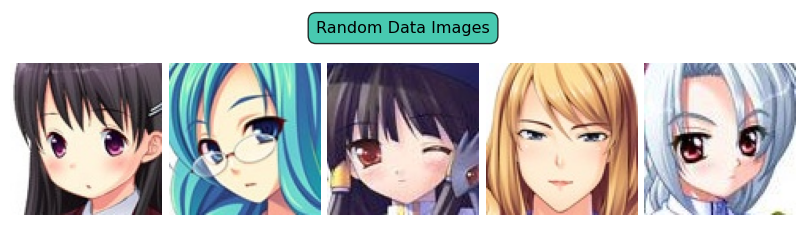

In [6]:
fig = plt.figure(figsize=(8, 2.5))
gs = GridSpec(2, 5, height_ratios=[0.15, 0.85])

title_ax = fig.add_subplot(gs[0, :])
title_ax.text(0.5, 0.5, "Random Data Images",
              fontsize=11.5, ha='center', va='center',
              bbox=dict(facecolor='#1ABC9C', edgecolor='black', 
                        boxstyle='round,pad=0.5', alpha=0.8))
title_ax.axis('off')

for j in range(5):
    ax = fig.add_subplot(gs[1, j])
    random_img = random.choice(image_paths)
    img = imread(random_img)
    ax.imshow(img)
    ax.axis('off')

plt.tight_layout(pad=0.5)
plt.show()

## 2-2. Check Image Dimensions

In [7]:
sizes = []

print("Processing images to get their dimensions...")

for img_path in tqdm(image_paths):
    width, height = imagesize.get(img_path)
    sizes.append(width)

Processing images to get their dimensions...


100%|██████████| 63565/63565 [03:43<00:00, 284.90it/s]


In [8]:
size_counts = Counter(sizes)
bin_size = 10
binned_counts = defaultdict(int)

for size, count in size_counts.items():
    bin_start = ((size - 1) // bin_size) * bin_size + 1
    bin_end = bin_start + bin_size - 1
    bin_label = f"{bin_start}-{bin_end}"
    binned_counts[bin_label] += count

sorted_bins = sorted(binned_counts.items(), key=lambda item: int(item[0].split('-')[0]))

labels = [item[0] for item in sorted_bins]
counts = [item[1] for item in sorted_bins]

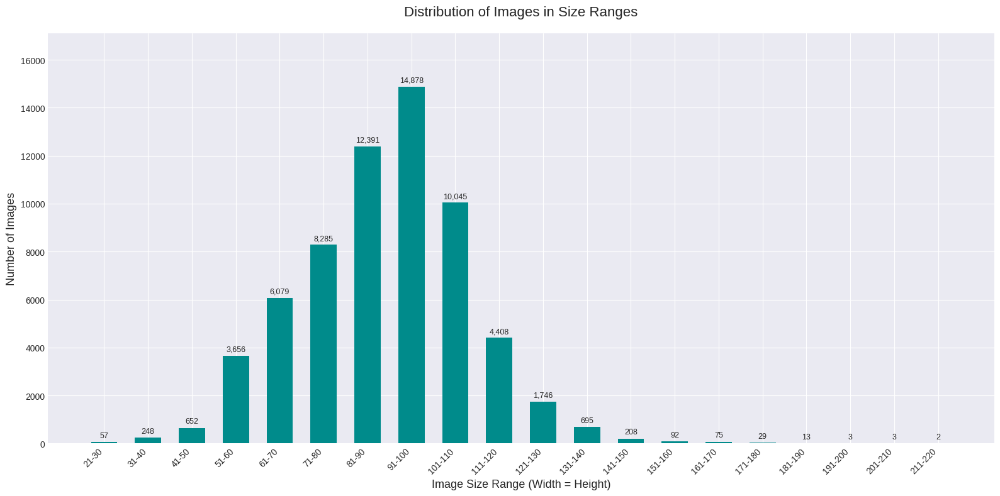

In [9]:
plt.style.use('seaborn-v0_8-darkgrid')
fig, ax = plt.subplots(figsize=(16, 8)) 

bars = ax.bar(labels, counts, color='darkcyan', width=0.6)

ax.set_title('Distribution of Images in Size Ranges', fontsize=16, pad=20)
ax.set_ylabel('Number of Images', fontsize=13)
ax.set_xlabel('Image Size Range (Width = Height)', fontsize=13)

plt.xticks(rotation=45, ha="right")

for bar in bars:
    height = bar.get_height()
    ax.annotate(f'{height:,}',
                xy=(bar.get_x() + bar.get_width() / 2, height),
                xytext=(0, 3),
                textcoords="offset points",
                ha='center', va='bottom', fontsize=9)

ax.set_ylim(top=max(counts) * 1.15)

plt.tight_layout()
plt.show()

In [10]:
filtered_image_paths = []

for img_path in image_paths:
    width, height = imagesize.get(img_path)
    if width > 50:
        filtered_image_paths.append(img_path)

<div class="alert alert-info" style="display: inline-block; padding: 8px 12px; margin: 0;">
Images with an image size (width = height) of <b>50 pixels or less</b> were <b>filtered out</b>.
</div>

## 2-3. Create Dataset

In [11]:
def load_images(image_paths, target_size):
    
    images = []
    
    for image_path in image_paths:
        image = Image.open(image_path).convert("RGB").resize(target_size)
        rescaled_image = np.array(image) / 127.5 - 1.0
        images.append(rescaled_image)

    images = np.array(images, dtype=np.float32)
    
    return images

In [12]:
def create_dataset(image_paths, target_size, batch_size, seed=42):
    
    images = load_images(image_paths, target_size)
    print(f"Number of Images: {images.shape[0]}")
    
    dataset = Dataset.from_tensor_slices(images)
    dataset = dataset.shuffle(seed)
    dataset = dataset.batch(batch_size)
        
    return dataset

In [13]:
img_height, img_width = (64, 64)
batch_size = 64

In [14]:
dataset = create_dataset(
    image_paths = filtered_image_paths, 
    target_size = (img_height, img_width),
    batch_size = batch_size,
    seed = 42
)

Number of Images: 62608


I0000 00:00:1757128800.250960      19 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15513 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0


# 3. Modeling

## 3-1. Build Model

In [15]:
# This model is based on the DCGAN architecture.

In [16]:
def build_generator_model(latent_dim=100):
    
    # Input layer: latent vector (noise)
    inp = layers.Input(shape=(latent_dim,))

    # Hidden Layers
    x = Sequential([
        layers.Dense(512*8*8, use_bias=False),
        layers.BatchNormalization(),
        layers.ReLU(),
        layers.Reshape((8, 8, 512)),
        layers.Conv2DTranspose(256, kernel_size=5, strides=2, padding="same", use_bias=False),
        layers.BatchNormalization(),
        layers.ReLU(),
        layers.Conv2DTranspose(128, kernel_size=5, strides=2, padding="same", use_bias=False),
        layers.BatchNormalization(),
        layers.ReLU(),
        layers.Conv2DTranspose(64, kernel_size=5, strides=2, padding="same", use_bias=False),
        layers.BatchNormalization(),
        layers.ReLU()
    ])(inp)
    
    # Output layer: tanh for [-1, 1] normalized images
    out = layers.Conv2DTranspose(3, kernel_size=5, strides=1, padding="same", use_bias=False, activation="tanh")(x)
    
    model = models.Model(inputs=inp, outputs=out)
    return model

In [17]:
def build_discriminator_model():

    # Input Layer
    inp = layers.Input(shape=(64, 64, 3))
    
    # Hidden Layers
    x = Sequential([
        layers.Conv2D(64, kernel_size=5, strides=2, padding="same", use_bias=False),
        layers.LeakyReLU(alpha=0.2),
        layers.SpatialDropout2D(0.3),
        layers.Conv2D(128, kernel_size=5, strides=2, padding="same", use_bias=False),
        layers.LeakyReLU(alpha=0.2),
        layers.SpatialDropout2D(0.3),
        layers.Conv2D(256, kernel_size=5, strides=2, padding="same", use_bias=False),
        layers.LeakyReLU(alpha=0.2),
        layers.SpatialDropout2D(0.3),
        layers.Flatten(),
        layers.Dense(512, use_bias=False),
        layers.LeakyReLU(alpha=0.2),
        layers.Dropout(0.3)
    ])(inp)
    
    # Output Layer: sigmoid for binary classification real/fake
    out = layers.Dense(1, activation='sigmoid')(x)
    
    model = models.Model(inputs=inp, outputs=out)
    return model

In [18]:
generator_model = build_generator_model()

discriminator_model = build_discriminator_model()

## 3-2. Model Training

In [19]:
@tf.function
def process_batch(generator_model, discriminator_model, batch, latent_dim,
                  loss_function, g_optimizer, d_optimizer):

    batch_size = batch.shape[0]
    noise = tf.random.normal([batch_size, latent_dim])

    with GradientTape() as g_tape, GradientTape() as d_tape:
        images = batch
        generated_images = generator_model(noise, training=True)

        real_output = discriminator_model(images, training=True)
        fake_output = discriminator_model(generated_images, training=True)
        
        fake_labels = tf.zeros((batch_size, 1))
        real_labels = tf.ones((batch_size, 1))
        
        g_loss = loss_function(real_labels, fake_output)
        d_loss = (
            loss_function(fake_labels, fake_output) +
            loss_function(real_labels, real_output)
        )

    g_optimizer.apply_gradients(zip(
        g_tape.gradient(g_loss, generator_model.trainable_variables), 
        generator_model.trainable_variables
    ))
    d_optimizer.apply_gradients(zip(
        d_tape.gradient(d_loss, discriminator_model.trainable_variables), 
        discriminator_model.trainable_variables
    ))

    return g_loss, d_loss

In [20]:
def plot_images(gen_imgs):

    gen_imgs = ((gen_imgs + 1) * 127.5).astype(np.uint8)

    fig, axs = plt.subplots(1, 5, figsize=(9, 3))
    for i in range(5):
        axs[i].imshow(gen_imgs[i])
        axs[i].axis('off')  
    plt.subplots_adjust(wspace=0.05)        
    plt.show()

In [21]:
def train_gan(generator_model, discriminator_model, dataset, epochs, 
              loss_function, g_optimizer, d_optimizer):
    
    history = []
    latent_dim = generator_model.input_shape[1]
    fixed_noise = tf.random.normal([5, latent_dim])
    
    for epoch in range(epochs):
        epoch_label = f"{epoch + 1}/{epochs}"
        g_losses = []
        d_losses = []
        
        for batch in tqdm(dataset, desc = f"Epoch {epoch_label} | Batches"):
            g_loss, d_loss = process_batch(
                generator_model, discriminator_model, batch, latent_dim,
                loss_function, g_optimizer, d_optimizer
            )
            g_losses.append(g_loss)
            d_losses.append(d_loss)
            
        report = {
            "epoch":    epoch_label,
            "g_loss": float(tf.reduce_mean(g_losses)),
            "d_loss": float(tf.reduce_mean(d_losses)),
            "gen_imgs": generator_model.predict(fixed_noise, verbose=0)
        }
        history.append(report)
        
        print(f"Epoch {report['epoch']} | G Loss: {report['g_loss']:.4f} | D Loss: {report['d_loss']:.4f}")
        plot_images(report['gen_imgs'])
        print()
        
    return history

Epoch 1/50 | Batches:   0%|          | 0/979 [00:00<?, ?it/s]E0000 00:00:1757128820.124763      19 meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape infunctional_3_1/sequential_1_1/spatial_dropout2d_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer
I0000 00:00:1757128820.510335      60 cuda_dnn.cc:529] Loaded cuDNN version 90300
Epoch 1/50 | Batches: 100%|█████████▉| 977/979 [01:39<00:00, 11.21it/s]E0000 00:00:1757128912.599072      19 meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape infunctional_3_1/sequential_1_1/spatial_dropout2d_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer
Epoch 1/50 | Batches: 100%|██████████| 979/979 [01:42<00:00,  9.58it/s]
I0000 00:00:1757128913.700711      62 service.cc:148] XLA service 0x1638164b0 initialized for platform CUDA (this does not guarantee that XLA will be used).

Epoch 1/50 | G Loss: 1.1291 | D Loss: 1.1463


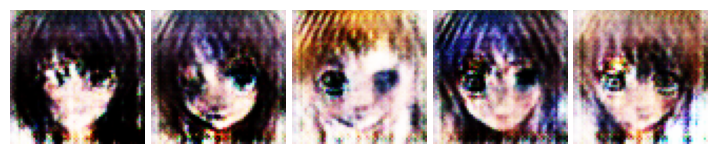

Epoch 2/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.22it/s]


Epoch 2/50 | G Loss: 0.8693 | D Loss: 1.2077


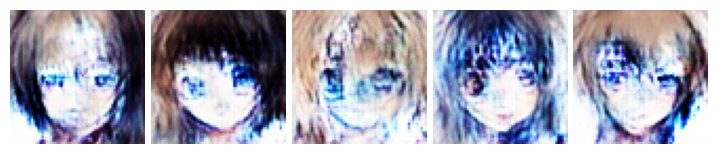

Epoch 3/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 3/50 | G Loss: 0.8858 | D Loss: 1.1724


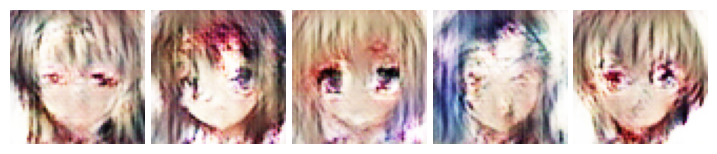

Epoch 4/50 | Batches: 100%|██████████| 979/979 [01:26<00:00, 11.25it/s]


Epoch 4/50 | G Loss: 0.8008 | D Loss: 1.2578


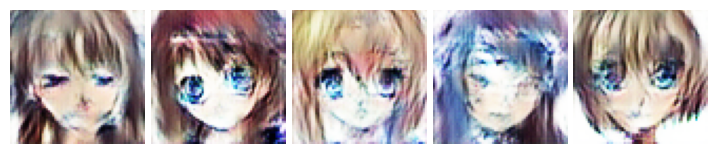

Epoch 5/50 | Batches: 100%|██████████| 979/979 [01:26<00:00, 11.25it/s]


Epoch 5/50 | G Loss: 0.7720 | D Loss: 1.3059


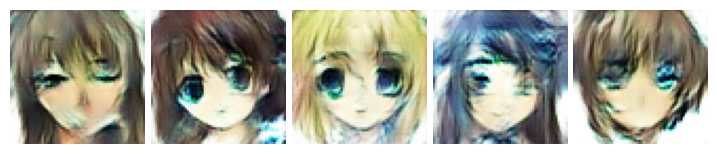

Epoch 6/50 | Batches: 100%|██████████| 979/979 [01:26<00:00, 11.26it/s]


Epoch 6/50 | G Loss: 0.7672 | D Loss: 1.3178


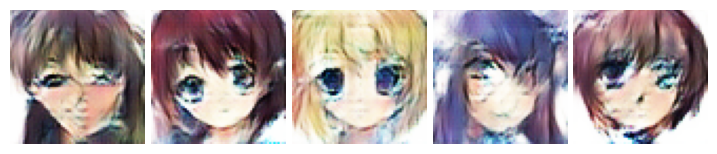

Epoch 7/50 | Batches: 100%|██████████| 979/979 [01:26<00:00, 11.25it/s]


Epoch 7/50 | G Loss: 0.7578 | D Loss: 1.3279


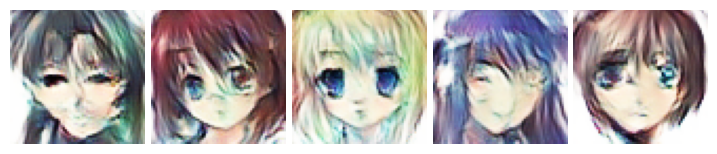

Epoch 8/50 | Batches: 100%|██████████| 979/979 [01:26<00:00, 11.26it/s]


Epoch 8/50 | G Loss: 0.7548 | D Loss: 1.3358


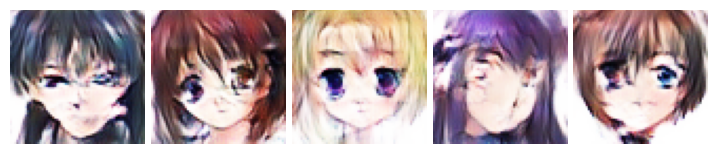

Epoch 9/50 | Batches: 100%|██████████| 979/979 [01:26<00:00, 11.25it/s]


Epoch 9/50 | G Loss: 0.7571 | D Loss: 1.3332


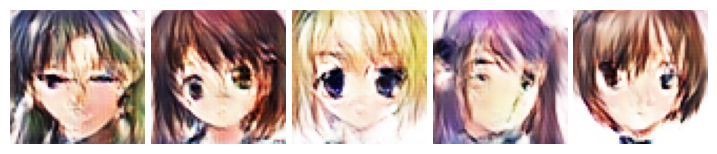

Epoch 10/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 10/50 | G Loss: 0.7568 | D Loss: 1.3329


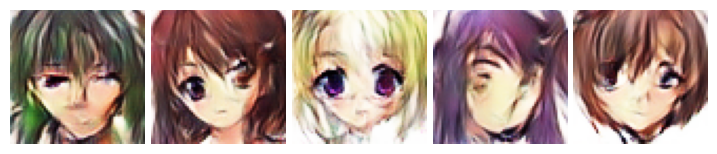

Epoch 11/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 11/50 | G Loss: 0.7669 | D Loss: 1.3266


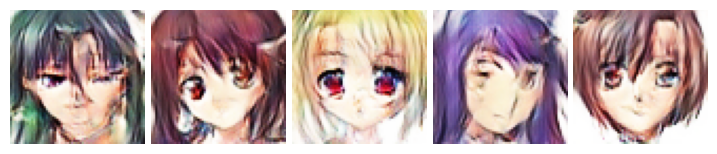

Epoch 12/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 12/50 | G Loss: 0.7720 | D Loss: 1.3222


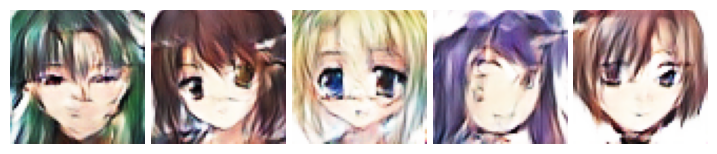

Epoch 13/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 13/50 | G Loss: 0.7778 | D Loss: 1.3155


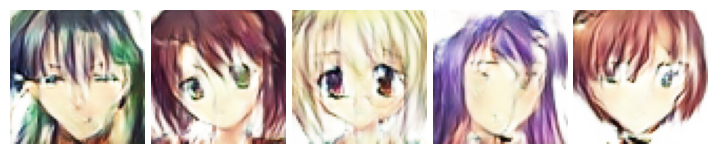

Epoch 14/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 14/50 | G Loss: 0.7828 | D Loss: 1.3122


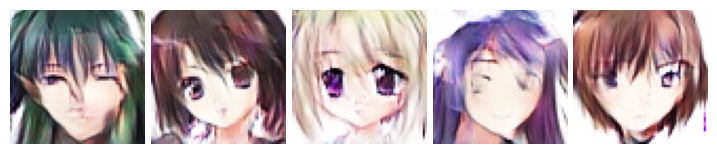

Epoch 15/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 15/50 | G Loss: 0.7886 | D Loss: 1.3061


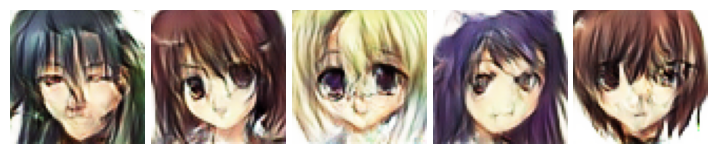

Epoch 16/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 16/50 | G Loss: 0.7940 | D Loss: 1.3006


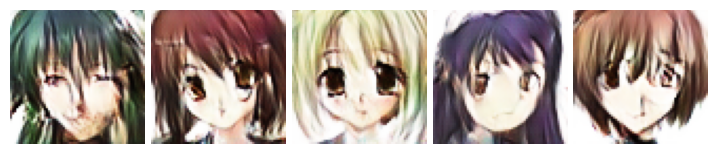

Epoch 17/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 17/50 | G Loss: 0.8059 | D Loss: 1.2918


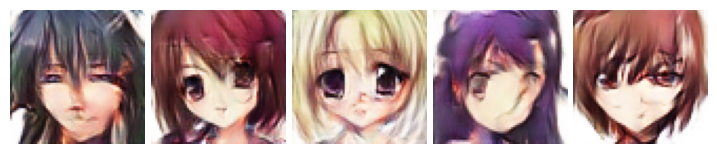

Epoch 18/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 18/50 | G Loss: 0.8115 | D Loss: 1.2834


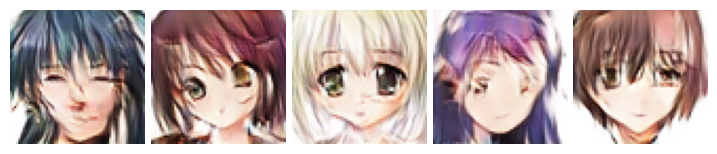

Epoch 19/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 19/50 | G Loss: 0.8207 | D Loss: 1.2767


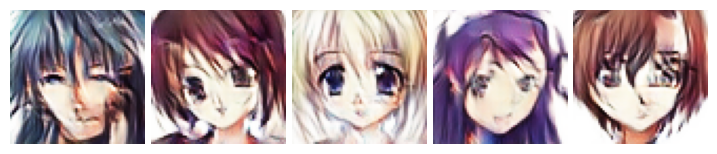

Epoch 20/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 20/50 | G Loss: 0.8277 | D Loss: 1.2688


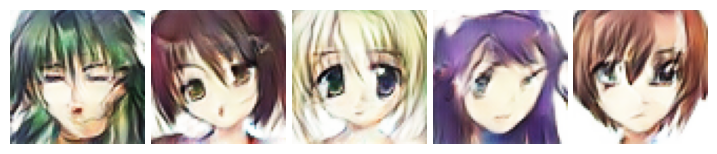

Epoch 21/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 21/50 | G Loss: 0.8309 | D Loss: 1.2687


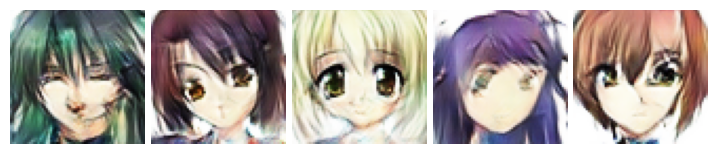

Epoch 22/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 22/50 | G Loss: 0.8477 | D Loss: 1.2531


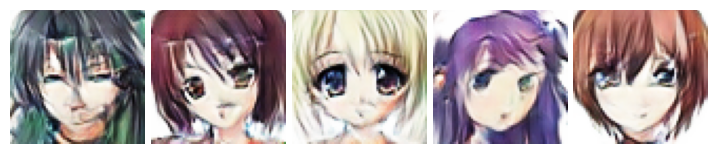

Epoch 23/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 23/50 | G Loss: 0.8554 | D Loss: 1.2462


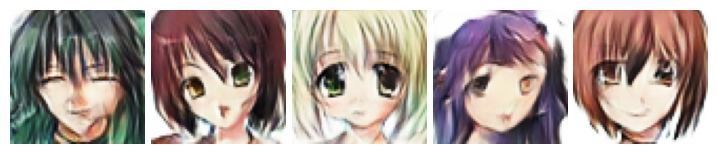

Epoch 24/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 24/50 | G Loss: 0.8647 | D Loss: 1.2412


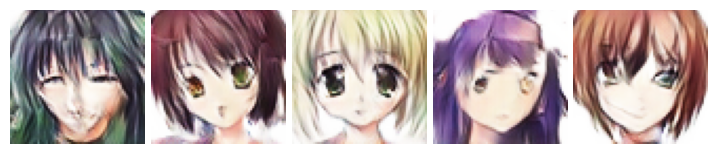

Epoch 25/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 25/50 | G Loss: 0.8716 | D Loss: 1.2329


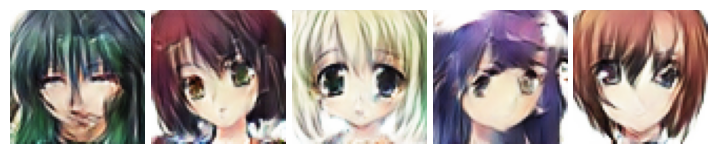

Epoch 26/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 26/50 | G Loss: 0.8875 | D Loss: 1.2235


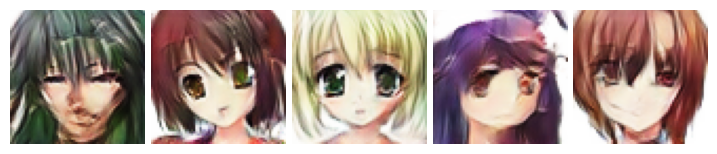

Epoch 27/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 27/50 | G Loss: 0.8981 | D Loss: 1.2132


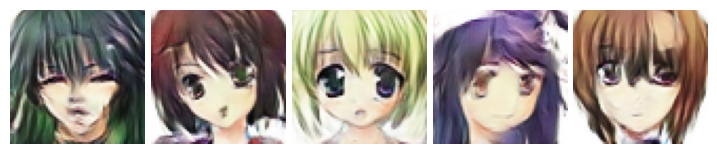

Epoch 28/50 | Batches: 100%|██████████| 979/979 [01:26<00:00, 11.25it/s]


Epoch 28/50 | G Loss: 0.9041 | D Loss: 1.2084


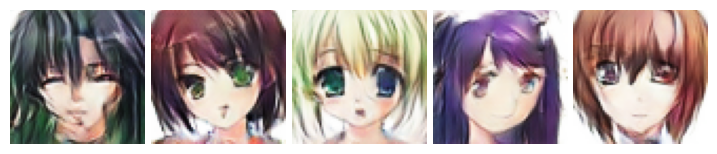

Epoch 29/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 29/50 | G Loss: 0.9187 | D Loss: 1.1961


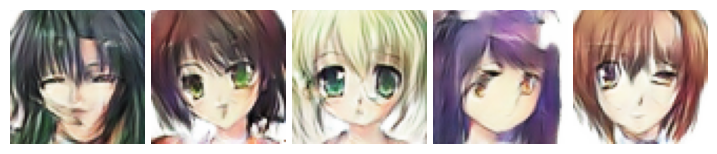

Epoch 30/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 30/50 | G Loss: 0.9356 | D Loss: 1.1859


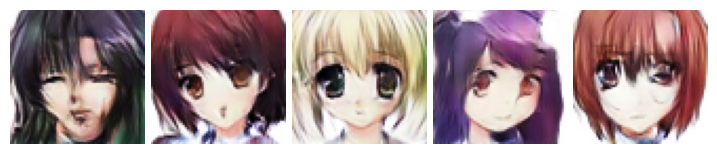

Epoch 31/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 31/50 | G Loss: 0.9438 | D Loss: 1.1763


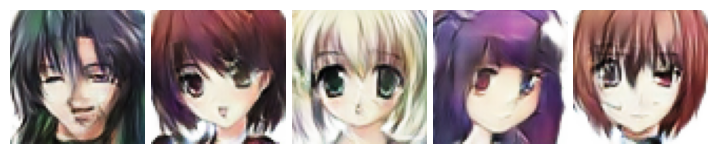

Epoch 32/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 32/50 | G Loss: 0.9615 | D Loss: 1.1641


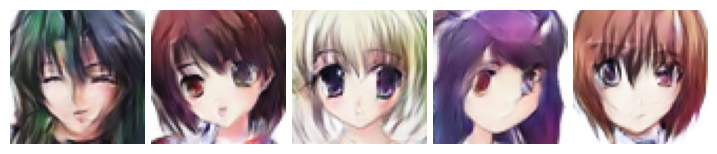

Epoch 33/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 33/50 | G Loss: 0.9773 | D Loss: 1.1537


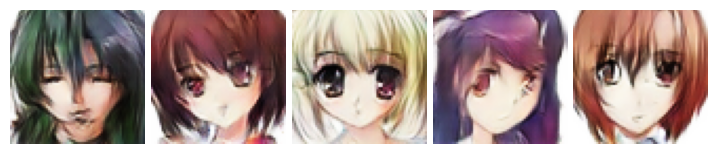

Epoch 34/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 34/50 | G Loss: 0.9916 | D Loss: 1.1464


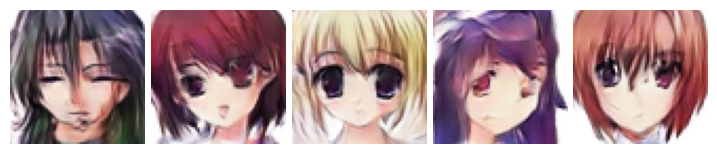

Epoch 35/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 35/50 | G Loss: 1.0023 | D Loss: 1.1383


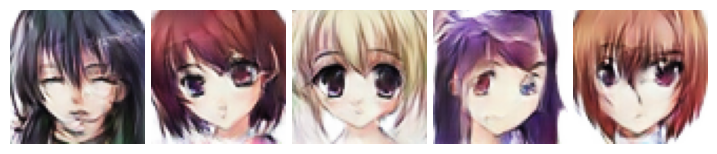

Epoch 36/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 36/50 | G Loss: 1.0099 | D Loss: 1.1306


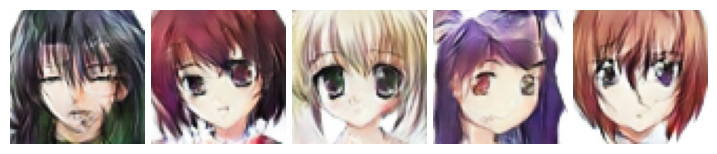

Epoch 37/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 37/50 | G Loss: 1.0257 | D Loss: 1.1197


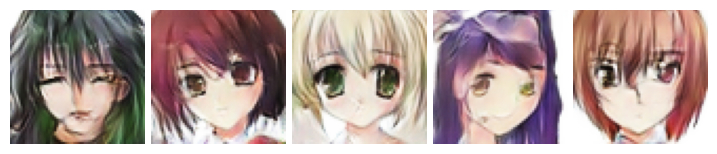

Epoch 38/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 38/50 | G Loss: 1.0346 | D Loss: 1.1138


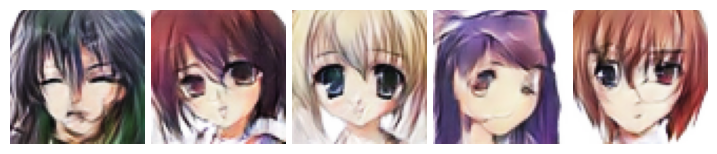

Epoch 39/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 39/50 | G Loss: 1.0418 | D Loss: 1.1087


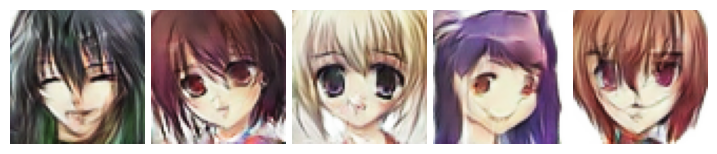

Epoch 40/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 40/50 | G Loss: 1.0548 | D Loss: 1.0989


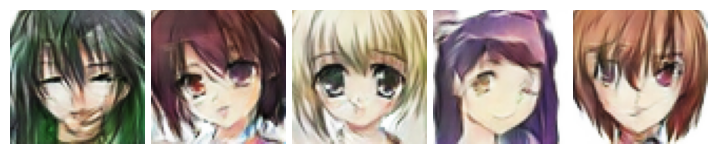

Epoch 41/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 41/50 | G Loss: 1.0665 | D Loss: 1.0890


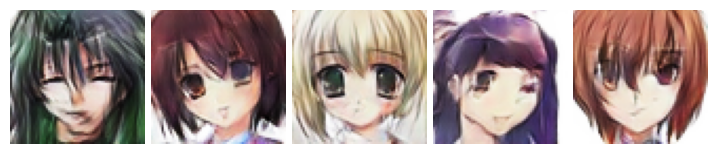

Epoch 42/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 42/50 | G Loss: 1.0820 | D Loss: 1.0826


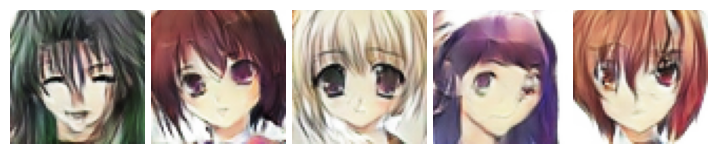

Epoch 43/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 43/50 | G Loss: 1.0867 | D Loss: 1.0759


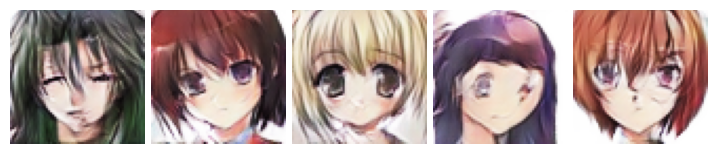

Epoch 44/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 44/50 | G Loss: 1.1003 | D Loss: 1.0678


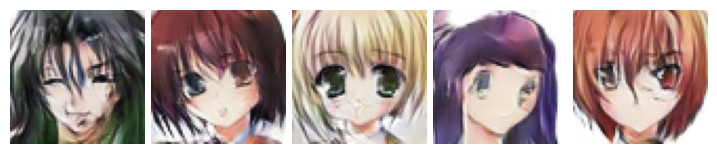

Epoch 45/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 45/50 | G Loss: 1.1081 | D Loss: 1.0623


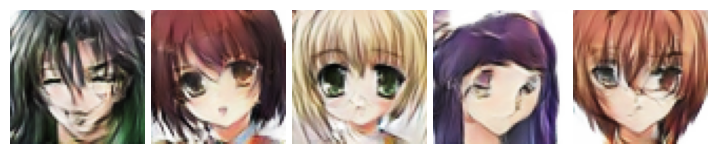

Epoch 46/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 46/50 | G Loss: 1.1235 | D Loss: 1.0579


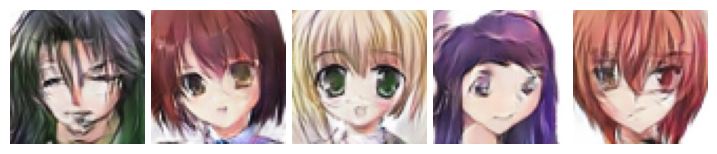

Epoch 47/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 47/50 | G Loss: 1.1292 | D Loss: 1.0490


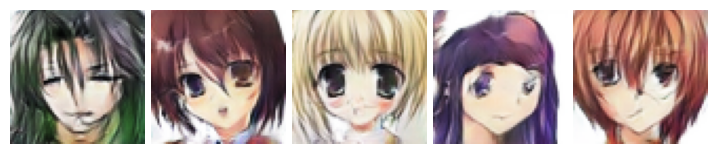

Epoch 48/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 48/50 | G Loss: 1.1483 | D Loss: 1.0415


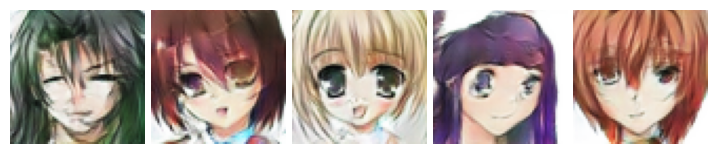

Epoch 49/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 49/50 | G Loss: 1.1569 | D Loss: 1.0327


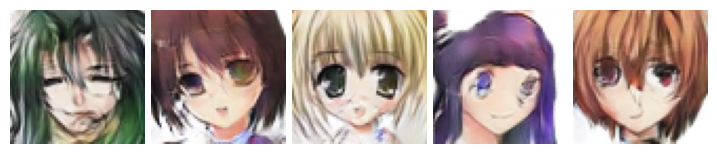

Epoch 50/50 | Batches: 100%|██████████| 979/979 [01:26<00:00, 11.25it/s]


Epoch 50/50 | G Loss: 1.1688 | D Loss: 1.0264


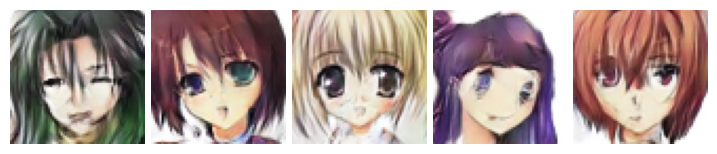

In [22]:
history = train_gan(
    generator_model, 
    discriminator_model, 
    dataset, 
    epochs = 50, 
    loss_function = BinaryCrossentropy(), 
    g_optimizer = Adam(2e-4, beta_1=0.5), 
    d_optimizer = Adam(1e-4, beta_1=0.5)
)

## 3-3. Loss Analysis

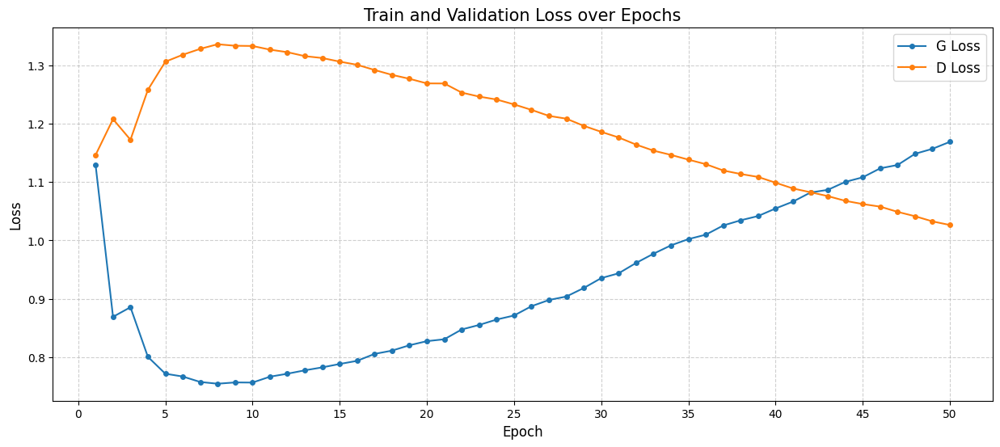

In [23]:
plt.style.use('default')
plt.figure(figsize=(15, 6))
plt.plot(range(1,51), [r['g_loss'] for r in history], label='G Loss', marker='o', markersize=4)
plt.plot(range(1,51), [r['d_loss'] for r in history], label='D Loss', marker='o', markersize=4)
plt.title("Train and Validation Loss over Epochs", fontsize=15)
plt.xlabel("Epoch", fontsize=12)
plt.ylabel("Loss", fontsize=12)
plt.xticks(range(0,51,5))
plt.legend(fontsize=12)
plt.grid(True, linestyle="--", alpha=0.6)
plt.show()

# 4. Generate Image

In [24]:
noise = tf.random.normal([5, generator_model.input_shape[1]])

gen_imgs = generator_model.predict(noise, verbose=0)
gen_imgs = ((gen_imgs + 1) * 127.5).astype(np.uint8)

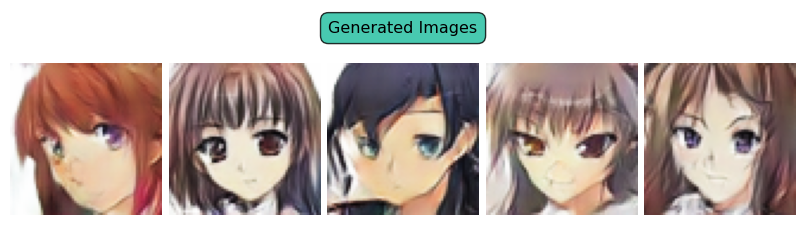

In [25]:
fig = plt.figure(figsize=(8, 2.5))
gs = GridSpec(2, 5, height_ratios=[0.15, 0.85])

title_ax = fig.add_subplot(gs[0, :])
title_ax.text(0.5, 0.5, "Generated Images",
              fontsize=11.5, ha='center', va='center',
              bbox=dict(facecolor='#1ABC9C', edgecolor='black', 
                        boxstyle='round,pad=0.5', alpha=0.8))
title_ax.axis('off')

for i in range(5):
    ax = fig.add_subplot(gs[1, i])
    ax.imshow(gen_imgs[i])
    ax.axis('off')

plt.tight_layout(pad=0.5)
plt.show()